# Capstone Project

#  Opening "Peaceful Restaurant" in New Delhi, India

 Written by Nataliya Parshyna

 Date: April 10, 2021

## Introduction

For this Capstone project, I am writing an analytical report for the restaurateur who wants to explore opening an authentic 

Chinese restaurant in New Delhi, India. The name of the restaurants is a Vancouver-based Chinese restaurant chain called 

“Peaceful Restaurant”. This businessman does not know anything about India, and particularly New Delhi restaurants businesses, 

and my job is to provide a full analysis of restaurants in New Delhi and come up with suggestions and recommendations about the 

whole idea of coming to the New Delhi market, and about potential factors of success for "Peaceful" restaurants in New Delhi. 

With the purpose in mind, I am designing this project to find out if it is a good idea at all to extend the "Peaceful" chain to 

New Delhi, and if it is, what factors would be the most important for the restaurant to succeed.


Business Problem

The objective of this capstone project is to predict if a Chinese restaurant business will succeed in New Delhi, India, and to 

find the most suitable location for the entrepreneur to open a new Chinese restaurant in New Delhi, India. By using data 

science methods and machine learning methods, this project aims to provide solutions to answer the business question: In New 

Delhi, India, if an entrepreneur wants to open a Chinese restaurant, what factors would lead to success.

Target Audience

'Peaceful Restaurant' restaurant chain owner who is looking to open a new location in New Delhi, India.

Data

To solve this problem, I will analyze the Zomato data set freely available on Kaggle.

## Plan

1. EDA
2. Preparing data for modeling
3. Clusters to find factors of success
4. Modeling to predict the rating

## PART I. EDA

EDA or Exploratory Data Analysis is an initial part of our analysis.
We will read the Zomato data first, get some initial insights about it, extract New Delhi information from the data, then check data for duplicates and null values, see some general information about the data, build visuals to better understand the data, and finally save the clean data table as a CSV file to use in the next notebook, Part II.

To begin our analysis, let us do some web scraping to read about New Delhi and to gain some information about this city.

We will import packages we might need in this project.

In [1]:
# Importing everything we need 

import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sns
import os

import plotly.offline as py
import plotly.graph_objs as go

from plotly.offline import init_notebook_mode
init_notebook_mode(connected=False)
import plotly.express as px
from geopy.geocoders import Nominatim
from folium.plugins import HeatMap
import folium
from tqdm import tqdm

import matplotlib.colors as mcolors

import warnings
warnings.filterwarnings('ignore')

In [2]:
import nltk
import urllib
import bs4 as bs
import pandas as pd
import re
from nltk.corpus import stopwords
nltk.download('stopwords')
import requests
import urllib.request
from bs4 import BeautifulSoup
from urllib.request import urlretrieve 
from urllib.request import urlopen, Request
import time


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\npars\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Information about New Delhi

To start, let us visit a Wikipedia page and find out about New Delhi.

In [3]:
import wikipedia

print(wikipedia.page("New_Delhi").content)

New Delhi ( (listen), Hindi: [ˈnəiː ˈdɪlːiː] Naī Dillī) is the capital of India and an administrative district of NCT Delhi. New Delhi is also the seat of all three branches of the government of India, hosting the Rashtrapati Bhavan, Parliament House, and the Supreme Court of India.
The foundation stone of New Delhi was laid by Emperor George V during the Delhi Durbar of 1911. It was designed by British architects Sir Edwin Lutyens and Sir Herbert Baker. The new capital was inaugurated on 13 February 1931, by Viceroy and Governor-General Lord Irwin.
Although colloquially Delhi and New Delhi are used interchangeably to refer to the National Capital Territory of Delhi (NCT), these are two distinct entities, with New Delhi forming a small part of the city of Delhi. The National Capital Region is a much larger entity comprising the entire NCT along with adjoining districts in neighbouring states which includes but is not limited to Ghaziabad, Noida, and Faridabad.


== History ==


=== Est

Here is a lot of interesting and useful information about New Delhi.  It is a very large commercial and cosmopolitan city with extensive transport chains that attracts millions of turists every year.

We also can find out what major areas and neighborhoods in these areas are in New Delhi.

In [4]:
source = urllib.request.urlopen('https://en.wikipedia.org/wiki/List_of_neighbourhoods_of_Delhi').read()
soup = bs.BeautifulSoup(source,'lxml')

In [5]:
text = ""
for paragraph in soup.find_all('p'):
    text += paragraph.text

In [6]:
print(soup.text)




List of neighbourhoods of Delhi - Wikipedia

































List of neighbourhoods of Delhi

From Wikipedia, the free encyclopedia



Jump to navigation
Jump to search


 Map showing the eleven districts of Delhi.
Delhi is a vast city and is home to a population of more than 16 million people. It is a microcosm of India and its residents belong to varied ethnic, religious and linguistic groups. As the second-largest city, and the capital of the nation, its 11 districts comprise multiple neighbourhoods. The large expanse of the city comprises residential districts that range from poor to affluent, and small and large commercial districts, across its municipal extent. This is a list of major neighbourhoods in the city and only pertains to the National Capital Territory of Delhi. It is not complete, and outlines the various neighbourhoods based on the different districts of the metropolis.

Contents

1 North West Delhi
2 North Delhi
3 North East Delhi
4 Central Delhi
5

#### New Delhi Neighborhoods

From his text, we can make a data table so we can easily see major areas in New Delhi.

In [7]:
# creating a data frame to help us to summarize our results.
d = {'North West Delhi': ['Adarsh Nagar', 'Ashok Vihar', 'Begum Pur', 'Karala', 'Model Town', 'Narela', 'Pitam Pura', 'Rohini Sub City', 'Shalimar Bagh', '','', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '','','', '','','', '', ''],
     'North Delhi': ['Civil Lines', 'Gulabi Bagh', 'Kamla Nagar', 'Kashmiri Gate', 'Kotwali', 'Mori Gate; Delhi', 'Sadar Bazaar', 'Sarai Rohilla', 'Shakti Nagar', 'Tis Hazari', 'Timarpur', 'Wazirabad','','', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '','','', '',''],
     'North East Delhi': ['Dilshad Garden', 'Naveen Shahdara', 'New Usmanpur', 'Shahdara', 'Shastri Park', 'Yamuna Vihar', '','', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '','','', '','','', '', '', '', '', ''],
     'Central Delhi': ['Chandni Chowk', 'Daryaganj', 'Jhandewalan', 'Karol Bagh', 'Shastri Nagar', 'Kishanganj', 'Paharganj', 'Rajender Nagar', '','', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '','', '', '', '', '', '', '', ''],
      'New Delhi': ['Barakhamba Road', 'Chanakyapuri', 'Connaught Place', 'Gole Market', 'INA Colony', 'Laxmibai Nagar', 'Pragati Maidan',  '','', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '','','', '','','', '', '', '', ''],
      'East Delhi': ['East Vinod Nagar', 'Jhilmil Colony', 'Laxmi Nagar', 'Mayur Vihar', 'Pandav Nagar', 'Preet Vihar', 'Anand Vihar', 'Vasundhara Enclave', 'Vishwas Nagar', 'Vivek Vihar', 'Kamal Hans Nagar', '','', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '','','', '','',''],
      'South Delhi': ['Alaknanda', 'Chattarpur', 'Chittaranjan Park', 'Defence Colony', 'East of Kailash', 'Govindpuri', 'Greater Kailash', 'Green Park', 'Gulmohar Park', 'Hauz Khas', 'Hauz Khas Village', 'Jangpura', 'Jor Bagh', 'Kalkaji', 'Khanpur', 'Lajpat Nagar', 'Lodi Colony', 'Malviya Nagar', 'Mehrauli', 'Neeti Bagh', 'Nehru Place', 'Netaji Nagar', 'New Friends Colony', 'Nizamuddin West', 'Okhla', 'Safdarjung Enclave', 'Sainik Farm', 'Saket', 'Sangam Vihar', 'Sarita Vihar', 'Sarojini Nagar', 'Sarvodaya Enclave', 'Siri Fort', 'South Extension', 'Sriniwaspuri', 'Sundar Nagar', 'Tughlaqabad', 'Badarpur'],
      'South West Delhi': ['Dabri, New Delhi', 'Dwarka Sub City', 'Delhi Cantonment', 'Dhaula Kuan', 'Inderpuri', 'Mahipalpur', 'Moti Bagh', 'Munirka', 'Najafgarh', 'Naraina Vihar', 'Palam', 'Rama Krishna Puram', 'Sagar Pur','Vasant Kunj', 'Vasant Vihar', '','', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '',''], 
     ' West Delhi': ['Ashok Nagar', 'Bali Nagar', 'Fateh Nagar', 'Kirti Nagar', 'Moti Nagar', 'Paschim Vihar', 'Patel Nagar', 'Punjabi Bagh', 'Rajouri Garden', 'Tihar Village', 'Tilak Nagar', 'Vikas Nagar', 'Vikaspuri', '','', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '','','', '']
    
 }
df_areas = pd.DataFrame(data=d)
df_areas

,North West Delhi,North Delhi,North East Delhi,Central Delhi,New Delhi,East Delhi,South Delhi,South West Delhi,West Delhi
0,Adarsh Nagar,Civil Lines,Dilshad Garden,Chandni Chowk,Barakhamba Road,East Vinod Nagar,Alaknanda,"Dabri, New Delhi",Ashok Nagar
1,Ashok Vihar,Gulabi Bagh,Naveen Shahdara,Daryaganj,Chanakyapuri,Jhilmil Colony,Chattarpur,Dwarka Sub City,Bali Nagar
2,Begum Pur,Kamla Nagar,New Usmanpur,Jhandewalan,Connaught Place,Laxmi Nagar,Chittaranjan Park,Delhi Cantonment,Fateh Nagar
3,Karala,Kashmiri Gate,Shahdara,Karol Bagh,Gole Market,Mayur Vihar,Defence Colony,Dhaula Kuan,Kirti Nagar
4,Model Town,Kotwali,Shastri Park,Shastri Nagar,INA Colony,Pandav Nagar,East of Kailash,Inderpuri,Moti Nagar
5,Narela,Mori Gate; Delhi,Yamuna Vihar,Kishanganj,Laxmibai Nagar,Preet Vihar,Govindpuri,Mahipalpur,Paschim Vihar
6,Pitam Pura,Sadar Bazaar,,Paharganj,Pragati Maidan,Anand Vihar,Greater Kailash,Moti Bagh,Patel Nagar
7,Rohini Sub City,Sarai Rohilla,,Rajender Nagar,,Vasundhara Enclave,Green Park,Munirka,Punjabi Bagh
8,Shalimar Bagh,Shakti Nagar,,,,Vishwas Nagar,Gulmohar Park,Najafgarh,Rajouri Garden
9,,Tis Hazari,,,,Vivek Vihar,Hauz Khas,Naraina Vihar,Tihar Village


There are 9 main areas in New Delhi:

North West Delhi, North Delhi, North East Delhi, Central Delhi, New Delhi, East Delhi, South Delhi, South West Delhi, and West Delhi. we will come back to these areas once we analyze localities in New Delhi.

In [8]:
# write df_nd_clean to CSV file for future needs

df_areas.to_csv('Nataliya_Parshyna_Peaceful_Restaurant_data_df_nd_areas.csv', index = False, header=True)

###  Zomato Data

#### General Information

Now let us load the data and see what insights we can get from it.

We will analyze a zomato data set publicly available at Kaggle website (https://www.kaggle.com/datasets?search=zomato&datasetsOnly=true). We will use a pd.read function for this.

In [9]:
df_zomato=pd.read_csv("Nataliya_Parshyna_Peaceful_Restaurant_data_zomato.csv",encoding='latin-1')

In [10]:
#checking our data
df_zomato.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


We can find out how many rows and columns in this data set.

In [11]:
df_zomato.shape

(9551, 21)

In [12]:
# Print out the shape of dataframe
print(f'There are {df_zomato.shape[0]} rows and {df_zomato.shape[1]} columns in the dataframe.')

There are 9551 rows and 21 columns in the dataframe.


In [13]:
df_zomato.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

#### Columns description

Columns description:


0. Restaurant ID: Specific number for the restaurant

1. Restaurant Name:  Name contains the name of the restaurant
    
2. Country Code:
   Codes for different countries
   
3. City:
    Name of the city where the restaurant is located
    
4. Address:
   Restaurant's address

5. Locality :
    Locality contains the neighborhood in which the restaurant is located
    
6.  Locality Verbose:
   Same as Locality column, but has the name of the city at the end
    
7. Longitude :
    Longitude of the restaurant's location
    
8. Latitude:
    Latitude of the restaurant's location
    
9. Cuisines  :
    Type of food the restaurant serves
    
10. Average Cost for two : 
    The average cost for 2 people is in Indian rupees
    
11. Currency:
    The currency that is used at the restaurant
    
12. Has Table booking :
    If the restaurant has an option for table booking
    
13. Has Online delivery: 
    If the restaurant has an option for online delivery
    
14. Is delivering now:
    If the restaurant is delivering right now
    
15. Switch to the order menu:
    If there is an opportunity to switch to the order menu
    
16. Price range: 
    The price range of the restaurant from 1 to 4

17. Aggregate rating: Rating of the restaurant from 0 to 5

18. Rating color:
    Different colors for different ratings
    
19. Rating text: Rating text stating how people like or dislike the restaurant
    
20. Votes: Contains the total number of rating for the restaurant as of the above-mentioned date
 

We can find out distinct cities in this data set. Particularly, we are interested in New Delhi.

In [14]:
df_zomato['City'].value_counts()

New Delhi    5473
Gurgaon      1118
Noida        1080
Faridabad     251
Ghaziabad      25
             ... 
Fernley         1
Montville       1
Princeton       1
Lorn            1
Bandung         1
Name: City, Length: 141, dtype: int64

There are 5,473 rows in this data set describing New Delhi restaurants.

###  New Delhi Data

We will extract New Delhi information from the Zomato data set and make a new data frame called df_new_delhi just for New Delhi city.

####  General Information

In [15]:
df_new_delhi = df_zomato[df_zomato['City'].str.contains("Delhi")]

In [16]:
df_new_delhi.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
2560,18287358,Food Cloud,1,New Delhi,"Aaya Nagar, New Delhi",Aaya Nagar,"Aaya Nagar, New Delhi",0.000000,0.000000,Cuisine Varies,...,Indian Rupees(Rs.),No,No,No,No,2,0.0,White,Not rated,2
2561,18216944,Burger.in,1,New Delhi,"84, Near Honda Showroom, Adchini, New Delhi",Adchini,"Adchini, New Delhi",77.196923,28.535382,Fast Food,...,Indian Rupees(Rs.),No,Yes,No,No,1,3.2,Orange,Average,46
2562,313333,Days of the Raj,1,New Delhi,"81/3, 1st Floor, Qutub Residency, Adchini, New...",Adchini,"Adchini, New Delhi",77.197475,28.535493,"North Indian, Seafood, Continental",...,Indian Rupees(Rs.),Yes,Yes,No,No,3,3.4,Orange,Average,45
2563,18384127,Dilli Ka Dhaba,1,New Delhi,"66 A, Ground Floor, Sri Aurobindo Marg, Adchin...",Adchini,"Adchini, New Delhi",77.198033,28.537547,"South Indian, North Indian",...,Indian Rupees(Rs.),No,No,No,No,2,2.6,Orange,Average,11
2564,582,Govardhan,1,New Delhi,"84, Adjacent Hero Motor Bike Showroom, Main Me...",Adchini,"Adchini, New Delhi",77.196924,28.535523,"South Indian, North Indian, Chinese",...,Indian Rupees(Rs.),No,Yes,No,No,2,3.4,Orange,Average,238


In [17]:
#reset indexes 
df_new_delhi.reset_index(drop=True, inplace=True)

In [18]:
df_new_delhi.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,18287358,Food Cloud,1,New Delhi,"Aaya Nagar, New Delhi",Aaya Nagar,"Aaya Nagar, New Delhi",0.000000,0.000000,Cuisine Varies,...,Indian Rupees(Rs.),No,No,No,No,2,0.0,White,Not rated,2
1,18216944,Burger.in,1,New Delhi,"84, Near Honda Showroom, Adchini, New Delhi",Adchini,"Adchini, New Delhi",77.196923,28.535382,Fast Food,...,Indian Rupees(Rs.),No,Yes,No,No,1,3.2,Orange,Average,46
2,313333,Days of the Raj,1,New Delhi,"81/3, 1st Floor, Qutub Residency, Adchini, New...",Adchini,"Adchini, New Delhi",77.197475,28.535493,"North Indian, Seafood, Continental",...,Indian Rupees(Rs.),Yes,Yes,No,No,3,3.4,Orange,Average,45
3,18384127,Dilli Ka Dhaba,1,New Delhi,"66 A, Ground Floor, Sri Aurobindo Marg, Adchin...",Adchini,"Adchini, New Delhi",77.198033,28.537547,"South Indian, North Indian",...,Indian Rupees(Rs.),No,No,No,No,2,2.6,Orange,Average,11
4,582,Govardhan,1,New Delhi,"84, Adjacent Hero Motor Bike Showroom, Main Me...",Adchini,"Adchini, New Delhi",77.196924,28.535523,"South Indian, North Indian, Chinese",...,Indian Rupees(Rs.),No,Yes,No,No,2,3.4,Orange,Average,238


In [19]:
df_new_delhi.shape

(5473, 21)

In [20]:
# Print out the shape of dataframe
print(f'There are {df_new_delhi.shape[0]} rows and {df_new_delhi.shape[1]} columns in the dataframe.')

There are 5473 rows and 21 columns in the dataframe.


We can see that the New Delhi data set is much smaller than the original Zomato data, with 5,473 rows as opposed to 9,551 rows. We will work with this smaller data set in this project. For the future, we can analyze the whole Zomato data set and derive more general information about restaurants around the world to make predictions more general.

In [21]:
# Checking for duplicates

# Columns 

print(f'Duplicated columns: {df_new_delhi.T.duplicated().any()}')


Duplicated columns: False


In [22]:
# Checking for duplicates

# Rows 

print(f'Duplicated rows: {df_new_delhi.duplicated().any()}')

Duplicated rows: False


There are no duplicated columns or rows in this data set.

In [23]:
# I will check if there are any null values

df_new_delhi.isna().sum()/df_new_delhi.shape[0]*100

Restaurant ID           0.0
Restaurant Name         0.0
Country Code            0.0
City                    0.0
Address                 0.0
Locality                0.0
Locality Verbose        0.0
Longitude               0.0
Latitude                0.0
Cuisines                0.0
Average Cost for two    0.0
Currency                0.0
Has Table booking       0.0
Has Online delivery     0.0
Is delivering now       0.0
Switch to order menu    0.0
Price range             0.0
Aggregate rating        0.0
Rating color            0.0
Rating text             0.0
Votes                   0.0
dtype: float64

There are no null values in this data.

In [24]:
# making a list of columns in data frame:
list(enumerate(df_new_delhi.columns, start=1))

[(1, 'Restaurant ID'),
 (2, 'Restaurant Name'),
 (3, 'Country Code'),
 (4, 'City'),
 (5, 'Address'),
 (6, 'Locality'),
 (7, 'Locality Verbose'),
 (8, 'Longitude'),
 (9, 'Latitude'),
 (10, 'Cuisines'),
 (11, 'Average Cost for two'),
 (12, 'Currency'),
 (13, 'Has Table booking'),
 (14, 'Has Online delivery'),
 (15, 'Is delivering now'),
 (16, 'Switch to order menu'),
 (17, 'Price range'),
 (18, 'Aggregate rating'),
 (19, 'Rating color'),
 (20, 'Rating text'),
 (21, 'Votes')]

#### Unique columns values

We can find value counts for all the columns in this data set.

In [25]:
df_new_delhi['Restaurant ID'].value_counts()

305151      1
18489545    1
18244564    1
8881        1
18238757    1
           ..
18138442    1
3403        1
5452        1
18464054    1
303104      1
Name: Restaurant ID, Length: 5473, dtype: int64

There are 5,473 uniques Restaurant IDs in this data set - each row has its unique  Restaurant ID.

In [26]:
df_new_delhi['City'].value_counts()

New Delhi    5473
Name: City, dtype: int64

There is only New Delhi city in this data frame as we made this table only for New Delhi.

In [27]:
df_new_delhi['Locality'].value_counts()

Connaught Place                   122
Rajouri Garden                     99
Shahdara                           87
Defence Colony                     86
Pitampura                          85
                                 ... 
Jor Bagh                            1
Sector 15, Dwarka                   1
City Centre Mall, Rohini            1
Kasbah, Greater Kailash (GK) 1      1
Kashmiri Gate                       1
Name: Locality, Length: 254, dtype: int64

There are 254 different localities (neighborhoods) in New Delhi.

In [28]:
df_new_delhi['Cuisines'].value_counts()

North Indian                                   658
North Indian, Chinese                          284
Fast Food                                      242
Chinese                                        228
North Indian, Mughlai                          207
                                              ... 
Fast Food, North Indian, Chinese, Desserts       1
Cafe, North Indian, Chinese, Continental         1
Italian, Continental, Mexican, North Indian      1
Ice Cream, Bakery                                1
Italian, Continental, Cafe                       1
Name: Cuisines, Length: 892, dtype: int64

Restaurants in New Delhi serve  892 unique cuisines. 

In [29]:
df_new_delhi['Locality Verbose'].value_counts()

Connaught Place, New Delhi               122
Rajouri Garden, New Delhi                 99
Shahdara, New Delhi                       87
Defence Colony, New Delhi                 86
Pitampura, New Delhi                      85
                                        ... 
Shastri Park, New Delhi                    1
Worldmark 3, Aerocity, New Delhi           1
Piccadily Hotel, Janakpuri, New Delhi      1
Holiday Inn, Aerocity, New Delhi           1
Sector 15, Dwarka, New Delhi               1
Name: Locality Verbose, Length: 254, dtype: int64

There are 254 Localities Verbose in this data. These are the same localities as in the Locality column, but having the name of the city after the locality name.

In [30]:
df_new_delhi['Currency'].value_counts()

Indian Rupees(Rs.)    5473
Name: Currency, dtype: int64

There is only one currency here. It is Indian Rupees.

In [31]:
df_new_delhi['Is delivering now'].value_counts()

No     5457
Yes      16
Name: Is delivering now, dtype: int64

Restaurants either deliver food (16 of them) or do not deliver (5,457 restaurants).

In [32]:
df_new_delhi['Switch to order menu'].value_counts()

No    5473
Name: Switch to order menu, dtype: int64

No restaurants have switched to the "order menu" option.

In [33]:
df_new_delhi['Price range'].value_counts()

1    3052
2    1656
3     549
4     216
Name: Price range, dtype: int64

The price range has 4 different values. However, we do not know what the actual values are. We will consider to drop this column.

In [34]:
df_new_delhi['Aggregate rating'].value_counts()

0.0    1425
3.1     358
3.2     353
3.3     332
3.0     318
3.4     302
3.5     286
2.9     253
3.6     251
3.7     231
2.8     216
3.8     200
2.7     170
3.9     160
2.6     129
4.0      89
4.1      84
4.2      64
2.5      64
2.4      46
4.3      32
4.4      31
2.3      25
2.2      14
4.5      11
4.6       8
2.1       8
4.7       5
4.9       3
2.0       2
1.9       2
4.8       1
Name: Aggregate rating, dtype: int64

The aggregate rating varies fom 0 to 4.8. I presume the scale is from 0 to 5. Many restaurants have rating of 0. 

In [35]:
df_new_delhi['Rating color'].value_counts()

Orange        2495
White         1425
Yellow        1128
Green          300
Red             97
Dark Green      28
Name: Rating color, dtype: int64

There 6 different rating colors. 

In [36]:
df_new_delhi['Rating text'].value_counts()

Average      2495
Not rated    1425
Good         1128
Very Good     300
Poor           97
Excellent      28
Name: Rating text, dtype: int64

There also 6 different options of Rating text.

#### Columns to drop

We can drop some columns as they do not bring new information.
We will drop columns:'Country Code','City', 'Locality Verbose', 'Currency', 'Switch to order menu', 'Is delivering now', 'Rating color', 'Rating text','Restaurant ID'.
- 'Country Code' - all codes are for India
- 'City' - only 1 city - New Delhi
- 'Locality Verbose' - states locality and the city where locality is which is New Delhi
- 'Currency' - only Indian Rupees(Rs.)
- 'Switch to order menu' - no restaurants switch to order menu
- 'Is delivering now' - only 16 of 5457 restaurants deliver now, so we ignore this option as not popular in New Delhi
- 'Rating color' - just described rating with colors, having the rating column is enough for this information
- 'Rating text' - associated with 'Aggregate rating'
- 'Restaurant ID' - specific numbers of each restaurant, no information for machine learning model

In [37]:
# Dropping the columns 'Country Code', 'City', 'Locality Verbose', 'Currency', 'Switch to order menu', 'Rating color', 'Address'

df_nd_clean = df_new_delhi.drop(['Country Code',
                                 'City',
                                 'Locality Verbose',
                                 'Currency',
                                 'Switch to order menu',
                                 'Is delivering now',
                                 'Price range',
                                 'Rating color',
                                 'Rating text',
                                'Restaurant ID',
                                'Address'], axis=1)

In [38]:
#checking data
df_nd_clean.head()

,Restaurant Name,Locality,Longitude,Latitude,Cuisines,Average Cost for two,Has Table booking,Has Online delivery,Aggregate rating,Votes
0,Food Cloud,Aaya Nagar,0.000000,0.000000,Cuisine Varies,500,No,No,0.0,2
1,Burger.in,Adchini,77.196923,28.535382,Fast Food,350,No,Yes,3.2,46
2,Days of the Raj,Adchini,77.197475,28.535493,"North Indian, Seafood, Continental",1500,Yes,Yes,3.4,45
3,Dilli Ka Dhaba,Adchini,77.198033,28.537547,"South Indian, North Indian",500,No,No,2.6,11
4,Govardhan,Adchini,77.196924,28.535523,"South Indian, North Indian, Chinese",500,No,Yes,3.4,238


In [39]:
print("dataset contains {} rows and {} columns".format(df_nd_clean.shape[0],df_nd_clean.shape[1]))

dataset contains 5473 rows and 10 columns


In [40]:
df_nd_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5473 entries, 0 to 5472
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant Name       5473 non-null   object 
 1   Locality              5473 non-null   object 
 2   Longitude             5473 non-null   float64
 3   Latitude              5473 non-null   float64
 4   Cuisines              5473 non-null   object 
 5   Average Cost for two  5473 non-null   int64  
 6   Has Table booking     5473 non-null   object 
 7   Has Online delivery   5473 non-null   object 
 8   Aggregate rating      5473 non-null   float64
 9   Votes                 5473 non-null   int64  
dtypes: float64(3), int64(2), object(5)
memory usage: 427.7+ KB


#### Columns description

Columns description:


1. Restaurant Name:  
    name contains the name of the restaurant

2. Locality :
    locality contains the neighborhood in which the restaurant is located
    
3. Longitude :
    Longitude of the restaurant's location
    
4. Latitude:
    Latitude of the restaurant's location
    
5. Cuisines  :
    Type of food the restaurant serves
    
6. Average Cost for two : 
    The average cost for 2 people in Indian rupees
    
7. Has Table booking :
    If the restaurant has an option for table booking
    
8. Has Online delivery: 
    If the restaurant has an option for online delivery

9. Price range: 
    The price range of the restaurant from 1 to 4

10. Aggregate rating: Rating of the restaurant from 0 to 5
    
11. Rating text: Rating text stating how people like or dislike the restaurant
    
12. Votes: Contains the total number of rating for the restaurant as of the above-mentioned date
 
 


We can find what columns are numerical, and what columns are categorical.

In [41]:
df_numerical   = df_nd_clean.select_dtypes(include = [np.number]).columns
df_categorical = df_nd_clean.select_dtypes(include= [np.object]).columns

In [42]:
df_numerical

Index(['Longitude', 'Latitude', 'Average Cost for two', 'Aggregate rating',
       'Votes'],
      dtype='object')

In [43]:
df_categorical

Index(['Restaurant Name', 'Locality', 'Cuisines', 'Has Table booking',
       'Has Online delivery'],
      dtype='object')

#### Visuals

##### Top Restaurant Chains

Let's find out which are the top restaurant chains in New Delhi?

Text(0.5, 0, 'Number of outlets')

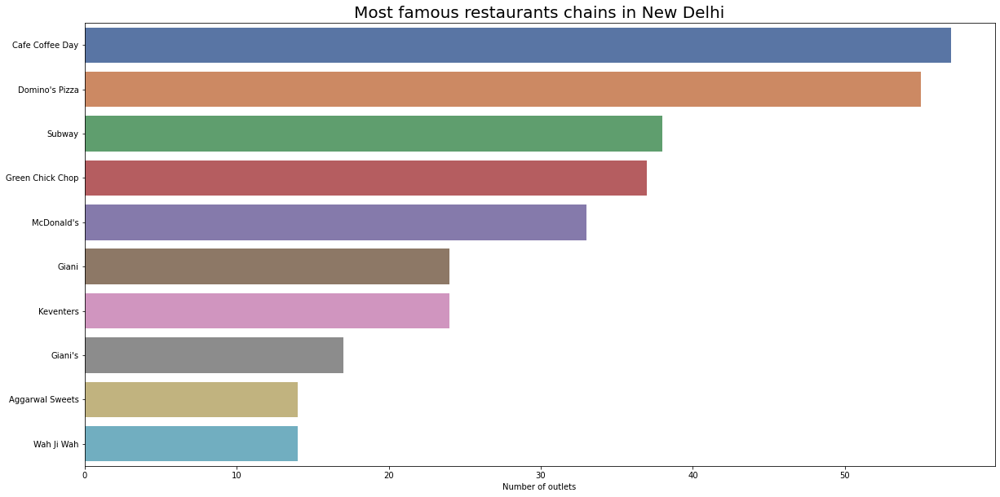

In [44]:
plt.figure(figsize=(20,10))
chains=df_nd_clean['Restaurant Name'].value_counts()[:10]
sns.barplot(x=chains,y=chains.index,palette='deep')
plt.title("Most famous restaurants chains in New Delhi", size=20 )
plt.xlabel("Number of outlets")

We can see Cafe Coffee Day, Domino's Pizza, and Subway have the most number of outlets in New Delhi. As of note, there are no popular Chinese restaurant chains in New Delhi.

##### Online delivery

Let's plot a graph to show how many of the restaurants do not accept online orders.

In [45]:
x=df_nd_clean['Has Online delivery'].value_counts()
colors = ['#007ED6', '#FF7300']

trace=go.Pie(labels=x.index,values=x,textinfo="value",
            marker=dict(colors=colors, 
                           line=dict(color='#000000', width=1)))
layout=go.Layout(title="Accepting vs Not accepting online orders",width=600,height=600)
fig=go.Figure(data=[trace],layout=layout)
py.iplot(fig, filename='pie_chart_subplots')
    

Most of the restaurants in New Delhi (73% of total restaurants) do not provide an online delivery option.

##### Table Booking

We can also plot a graph to show how many restaurants provide a table booking option.

In [46]:
x=df_nd_clean['Has Table booking'].value_counts()
colors = ['#7CDDDD', '#FFEC00']

trace=go.Pie(labels=x.index,values=x,textinfo="value",
            marker=dict(colors=colors, 
                           line=dict(color='#000000', width=1)))
layout=go.Layout(title="Has table booking vs No  table booking",width=600,height=600)
fig=go.Figure(data=[trace],layout=layout)
py.iplot(fig, filename='pie_chart_subplots')

Most of restaurants in New Delhi (87%) do not provide an option of table booking.

##### Cuisines

Let us explore types of cuisines in New Delhi restaurants.

In [47]:
df_nd_clean["Cuisines"].describe()

count             5473
unique             892
top       North Indian
freq               658
Name: Cuisines, dtype: object

In [48]:
df_nd_clean["Cuisines"].value_counts()

North Indian                                   658
North Indian, Chinese                          284
Fast Food                                      242
Chinese                                        228
North Indian, Mughlai                          207
                                              ... 
Fast Food, North Indian, Chinese, Desserts       1
Cafe, North Indian, Chinese, Continental         1
Italian, Continental, Mexican, North Indian      1
Ice Cream, Bakery                                1
Italian, Continental, Cafe                       1
Name: Cuisines, Length: 892, dtype: int64

There are 892 different cuisines in New Delhi. We can plot them to visualize what are the top ones.

Text(0.5, 0, 'count')

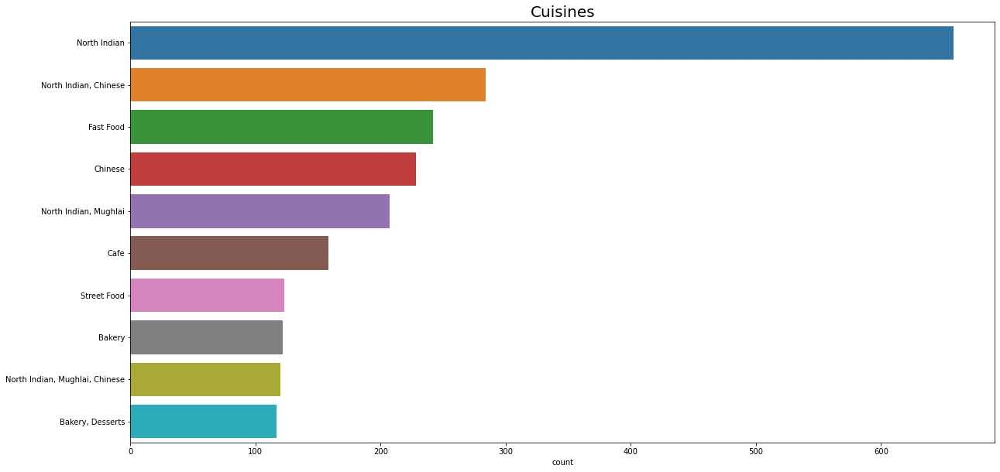

In [49]:
plt.figure(figsize=(20, 10))
rest=df_nd_clean['Cuisines'].value_counts()[:10]
sns.barplot(rest,rest.index)
plt.title('Cuisines', size=20)
plt.xlabel('count', size=10)

###### Chinese Cuisines

We can explore Chinese cousins in New Delhi. we will make a new data frame chinese_df where the 'Cuisines' column contains the word "Chinese".

In [50]:
#extracting cuisines names where nemes contain a word "chinese"
df_nd_clean[df_nd_clean['Cuisines'].str.contains("Chinese")].head()

,Restaurant Name,Locality,Longitude,Latitude,Cuisines,Average Cost for two,Has Table booking,Has Online delivery,Aggregate rating,Votes
4,Govardhan,Adchini,77.196924,28.535523,"South Indian, North Indian, Chinese",500,No,Yes,3.4,238
9,Waves,Adchini,77.198808,28.538666,"North Indian, Chinese",1500,Yes,Yes,3.5,141
10,Delhi Darbar,Adchini,77.196967,28.535763,"Chinese, North Indian",500,No,No,2.2,77
17,Sultanat,"Aditya Mega Mall, Karkardooma",77.301603,28.656262,"North Indian, Chinese, Continental",1000,Yes,Yes,3.7,288
19,Clever Fox Cafe,Aerocity,77.120642,28.551690,"North Indian, Continental, Chinese",900,Yes,No,3.2,26


In [51]:
# make a new data frame where cuisines are strictly Chinese.
chinese_df = df_nd_clean.loc[df_nd_clean['Cuisines'] == 'Chinese']

In [52]:
#reset indexes 
chinese_df.reset_index(drop=True, inplace=True)

In [53]:
#checking Chinese data table
chinese_df.head()

,Restaurant Name,Locality,Longitude,Latitude,Cuisines,Average Cost for two,Has Table booking,Has Online delivery,Aggregate rating,Votes
0,Madhuvan Chinese Fast Food,Alaknanda,77.253246,28.525603,Chinese,300,No,Yes,2.5,32
1,Neha's Treat,Alaknanda,77.254031,28.525793,Chinese,450,No,No,2.9,42
2,Mandarin,Anand Vihar,77.306166,28.659803,Chinese,600,No,No,2.8,14
3,Tulsi Ram Chinese Hut,Anand Vihar,77.306241,28.659533,Chinese,200,No,No,0.0,0
4,6 Pack Momos,Ashok Vihar Phase 1,77.172422,28.694022,Chinese,300,No,No,0.0,1


In [54]:
chinese_df.shape

(228, 10)

There 228 rows and 12 columns in the chinese_df.

We can plot restaurants serving purely Chinese food.

First, we need to find New Delhi's average coordinates: latitude and longitude.

In [55]:
#Obtain the coordinates from the dataset itself, just averaging Latitude/Longitude of the current dataset 
lat_New_Delhi1 = chinese_df ['Latitude'].mean()
lon_New_Delhi1 = chinese_df ['Longitude'].mean()
print('The geographical coordinates of New Delhi are {}, {}'.format(lat_New_Delhi1, lon_New_Delhi1))

The geographical coordinates of New Delhi are 27.614275912192994, 74.4830436536842


In [56]:
map_New_Delhi1 = folium.Map(location=[lat_New_Delhi1, lon_New_Delhi1], zoom_start=12)

In [57]:
restaurants = folium.map.FeatureGroup()

In [58]:
for lat, lng, in zip(chinese_df['Latitude'], chinese_df['Longitude']):
    restaurants.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5,
            color='blue',
fill=True, 
fill_color='orange', 
fill_opacity=0.6
)
)
map_New_Delhi1.add_child(restaurants)  
    
    

In [59]:
# save the map as HTML file
map_New_Delhi1.save('Nataliya_Parshyna_Peaceful_Restaurant_data_map_New_Delhi1.html')

We plotted restaurants that serve Chinese food in New Delhi.

##### Rating

Next, let us explore the rating. We can plot different ratings and see if there are any interesting insights here.

Text(0.5, 1.0, 'Rating')

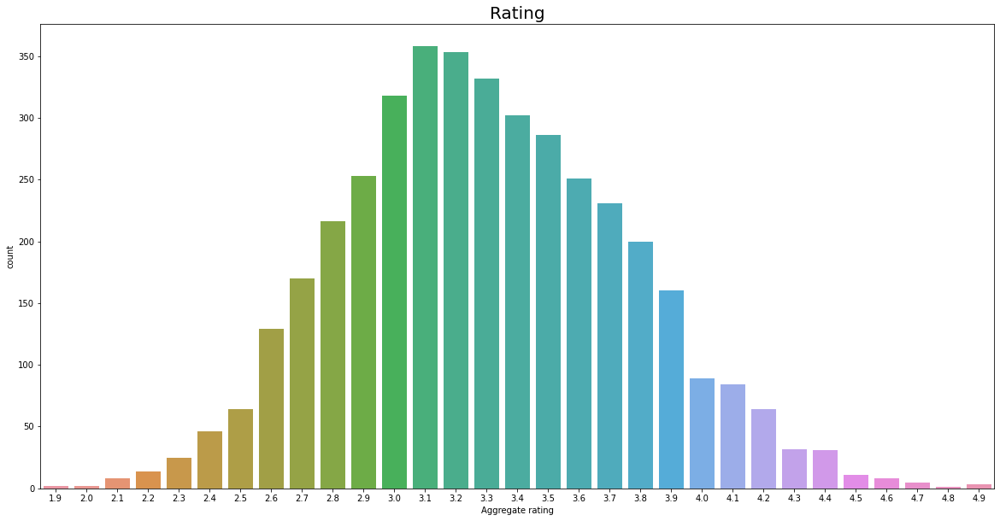

In [60]:
# We will plot the ratings which are not 0.

f, ax = plt.subplots(1,1, figsize = (20, 10))
ax = sns.countplot(df_nd_clean[df_nd_clean['Aggregate rating'] != 0]['Aggregate rating'])
plt.title('Rating', size=20)


It seems that most restaurants have an average rating of 3.1. Rating distribution has a Gaussian or normal distribution pattern with a peak at 3.1.

##### Average Cost for two

Let's plot a graph showing prices and find price distribution.

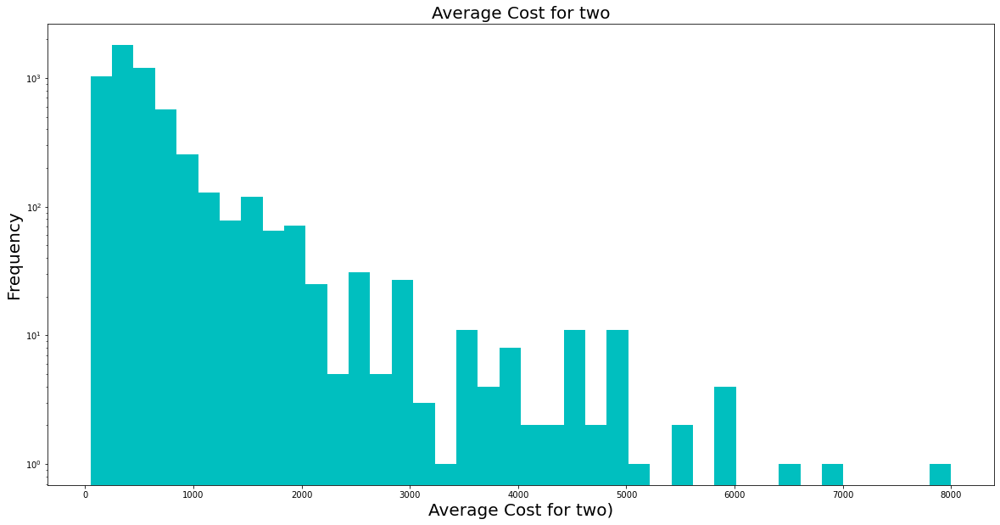

In [61]:
plt.figure(figsize=(20, 10))
plt.hist(df_nd_clean['Average Cost for two'], bins=40, color='c')
plt.xlabel('Average Cost for two)', size=20)
plt.yscale("log")
plt.ylabel('Frequency', size=20)
plt.title('Average Cost for two', size=20)
plt.show()

The average cost for 2 people is about 500 Indian Rupees(Rs.) in the majority of restaurants.

---Note: 1 Indian Rupee is 0.017 Canadian Dollars---

Thus, the average cost for 2 people in a New Delhi restaurant is about 8.5 Canadian dollars.

The distribution is exponential with some outliers in this data. Rarely, the average price for two goes up to 7,000-8,000 Indian Rupees or 120-140 Canadian dollars. 

In [62]:
# find outliers


high_cost__df = df_nd_clean[df_nd_clean['Average Cost for two'].between(4000, 8000)]

In [63]:
high_cost__df 

,Restaurant Name,Locality,Longitude,Latitude,Cuisines,Average Cost for two,Has Table booking,Has Online delivery,Aggregate rating,Votes
504,Privee',Connaught Place,77.218260,28.620999,"Chinese, Italian, Continental, North Indian",5000,No,No,3.6,61
1031,Blooms - Eros Hotel,"Eros Hotel, Nehru Place",77.249541,28.549932,"Continental, North Indian, Italian",4000,Yes,No,3.9,150
1034,Empress of China - Eros Hotel,"Eros Hotel, Nehru Place",77.250169,28.550082,Chinese,4800,Yes,No,4.2,119
1041,Indian Accent - The Manor,Friends Colony,77.257106,28.570142,Modern Indian,4000,No,No,4.9,1934
1455,Jasmine - Hotel The Royal Plaza,"Hotel The Royal Plaza, Janpath",77.217073,28.621276,"Seafood, Chinese, Japanese, Sushi, Thai",4000,Yes,No,3.7,44
1459,La Piazza - Hyatt Regency,"Hyatt Regency, Bhikaji Cama Place",77.185331,28.569040,Italian,4500,Yes,No,3.9,410
1462,T.K'S Oriental Grill - Hyatt Regency,"Hyatt Regency, Bhikaji Cama Place",77.185331,28.569040,"Japanese, Thai, Sushi",4000,Yes,No,3.9,290
1463,China Kitchen - Hyatt Regency,"Hyatt Regency, Bhikaji Cama Place",77.185331,28.569040,Chinese,4500,Yes,No,4.0,424
1527,Bukhara - ITC Maurya,"ITC Maurya, Chanakyapuri",77.173724,28.597466,North Indian,6500,No,No,4.4,2826
1528,Tian - Asian Cuisine Studio - ITC Maurya,"ITC Maurya, Chanakyapuri",77.173455,28.597351,"Asian, Japanese, Korean, Thai, Chinese",7000,No,No,4.1,188


In [64]:
#reset indexes 

high_cost__df.reset_index(drop=True, inplace=True)

In [65]:
high_cost__df

,Restaurant Name,Locality,Longitude,Latitude,Cuisines,Average Cost for two,Has Table booking,Has Online delivery,Aggregate rating,Votes
0,Privee',Connaught Place,77.218260,28.620999,"Chinese, Italian, Continental, North Indian",5000,No,No,3.6,61
1,Blooms - Eros Hotel,"Eros Hotel, Nehru Place",77.249541,28.549932,"Continental, North Indian, Italian",4000,Yes,No,3.9,150
2,Empress of China - Eros Hotel,"Eros Hotel, Nehru Place",77.250169,28.550082,Chinese,4800,Yes,No,4.2,119
3,Indian Accent - The Manor,Friends Colony,77.257106,28.570142,Modern Indian,4000,No,No,4.9,1934
4,Jasmine - Hotel The Royal Plaza,"Hotel The Royal Plaza, Janpath",77.217073,28.621276,"Seafood, Chinese, Japanese, Sushi, Thai",4000,Yes,No,3.7,44
5,La Piazza - Hyatt Regency,"Hyatt Regency, Bhikaji Cama Place",77.185331,28.569040,Italian,4500,Yes,No,3.9,410
6,T.K'S Oriental Grill - Hyatt Regency,"Hyatt Regency, Bhikaji Cama Place",77.185331,28.569040,"Japanese, Thai, Sushi",4000,Yes,No,3.9,290
7,China Kitchen - Hyatt Regency,"Hyatt Regency, Bhikaji Cama Place",77.185331,28.569040,Chinese,4500,Yes,No,4.0,424
8,Bukhara - ITC Maurya,"ITC Maurya, Chanakyapuri",77.173724,28.597466,North Indian,6500,No,No,4.4,2826
9,Tian - Asian Cuisine Studio - ITC Maurya,"ITC Maurya, Chanakyapuri",77.173455,28.597351,"Asian, Japanese, Korean, Thai, Chinese",7000,No,No,4.1,188


It is interesting to see that some restaurants serving Chinese and Combined Chinese cuisines have quite a high  'Average Cost for two'. Moreover, these restaurants have higher than average ratings. We will keep these outliers as relevant to the project as this project is about opening a Chinese restaurant. We will keep in mind though that these outliers might affect our Machine Learning Models as potential issues with imbalanced classes.

If we want to see these 'Average Cost for two' higher than average values in Canadian dollars, they are from 70 to 140 Canadian dollars (4,000 - 8,000 Indian Rupees, 1 Indian Rupee = 0.017 Canadian Dollars).

##### Localities

We can plot different localities as well.

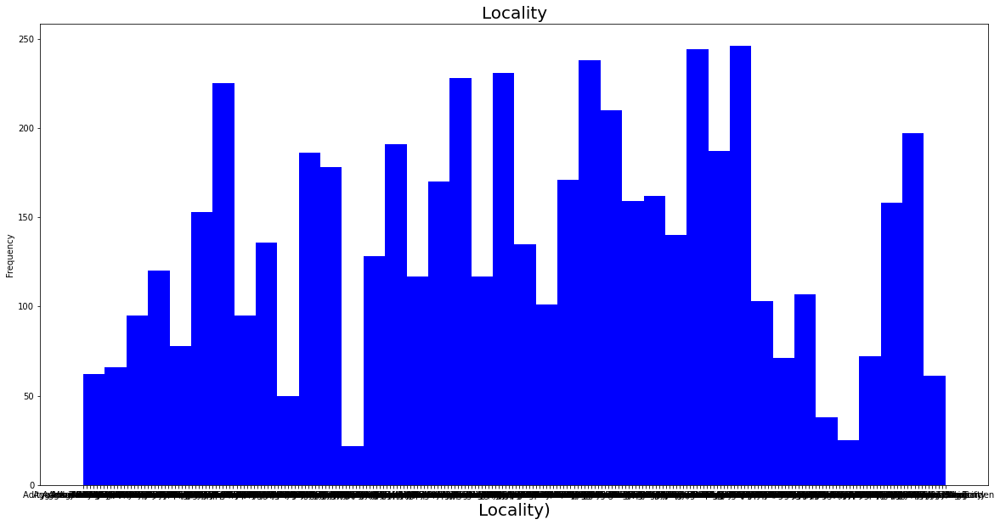

In [66]:
plt.figure(figsize=(20, 10))
plt.hist(df_nd_clean['Locality'], bins=40, color='b')
plt.xlabel('Locality)', size=20)

plt.ylabel('Frequency', size=10)
plt.title('Locality', size=20)
plt.show()

We see there multiple locations where restaurants are located. There is no particular neighborhood with the majority of restaurants.

In [67]:
#Create list with the localities (to be used later)
localities = df_nd_clean['Locality'].unique().tolist()

In [68]:
#cheking localities
localities

['Aaya Nagar',
 'Adchini',
 'Aditya Mega Mall, Karkardooma',
 'Aerocity',
 'Aggarwal City Mall, Pitampura',
 'Aggarwal City Plaza, Rohini',
 'Alaknanda',
 'Ambience Mall, Vasant Kunj',
 'Anand Lok',
 'Anand Vihar',
 'Andaz Delhi, Aerocity',
 'Ansal Plaza Mall, Khel Gaon Marg',
 'ARSS Mall, Paschim Vihar',
 'Asaf Ali Road',
 'Ashok Vihar Phase 1',
 'Ashok Vihar Phase 2',
 'Ashok Vihar Phase 3',
 'Barakhamba Road',
 'Basant Lok Market, Vasant Vihar',
 'Bellagio, Ashok Vihar Phase 2',
 'Best Western Taurus Hotel, Mahipalpur',
 'Bhikaji Cama Place',
 'Centaur Hotel, Aerocity',
 'Chanakyapuri',
 'Chander Nagar',
 'Chandni Chowk',
 'Chawri Bazar',
 'Chhatarpur',
 'Chittaranjan Park',
 'City Centre Mall, Rohini',
 'City Square Mall, Rajouri Garden',
 'Civil Lines',
 'Community Centre, New Friends Colony',
 'Connaught Place',
 'Crescent Square Mall, Rohini',
 'Cross River Mall, Karkardooma',
 'Crowne Plaza Hotel, Rohini',
 'Crowne Plaza, Mayur Vihar Phase 1',
 'D Mall, Netaji Subhash Place',
 

Now let us plot all restaurants in New Delhi on the map. We will mark different localities and make visible different cuisines.

In [69]:
#Obtain the coordinates from the dataset itself, just averaging Latitude/Longitude of the current dataset 

lat_New_Delhi = df_nd_clean['Latitude'].mean()
lon_New_Delhi = df_nd_clean['Longitude'].mean()
print('The geographical coordinates of New Delhi are {}, {}'.format(lat_New_Delhi, lon_New_Delhi))

The geographical coordinates of New Delhi are 27.39820543576831, 73.90379162546503


In [70]:
locality_color = {}
for i in localities:
    locality_color[i] = '#%02X%02X%02X' % tuple(np.random.choice(range(256), size=3)) #Random color

In [71]:
map_New_Delhi = folium.Map(location=[lat_New_Delhi, lon_New_Delhi], zoom_start=12)

In [72]:
for lat, lng, i, cuisine in zip(df_nd_clean['Latitude'], 
                    df_nd_clean['Longitude'],
                    df_nd_clean['Locality'],
                     df_nd_clean['Cuisines']):
    label_text = cuisine 
    label = folium.Popup(label_text)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=locality_color[i],
        fill_color=locality_color[i],
        fill_opacity=0.7).add_to(map_New_Delhi)  
    
map_New_Delhi

In [73]:
# save the map as HTML file
map_New_Delhi.save('Nataliya_Parshyna_Peaceful_Restaurant_data_map_New_Delhi.html')

##### Columns

And, finally, let's quickly take a look at different column values distribution to gain a better idea about our data.

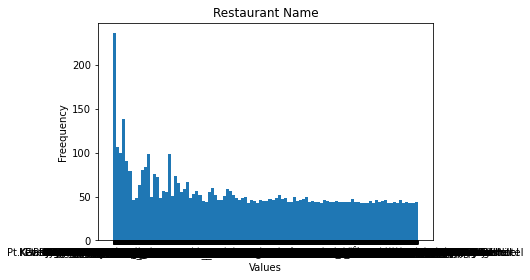

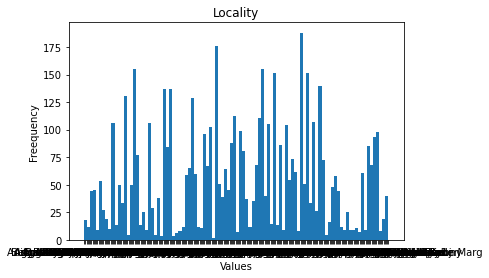

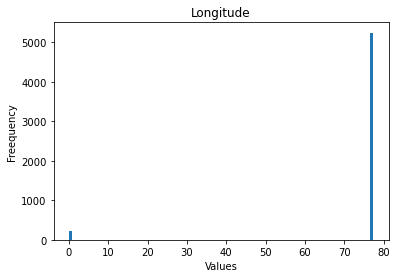

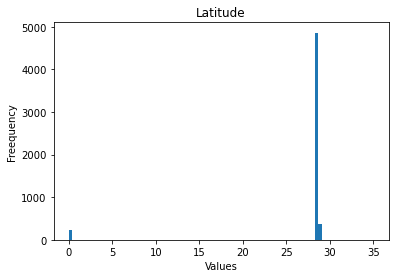

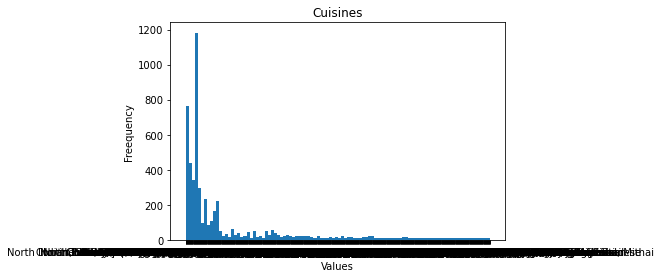

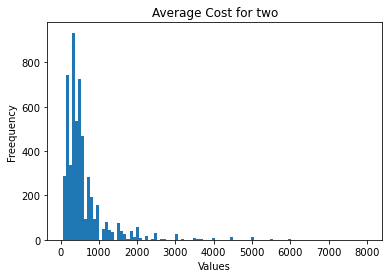

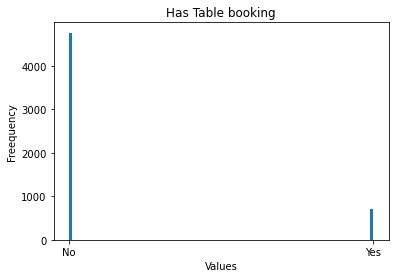

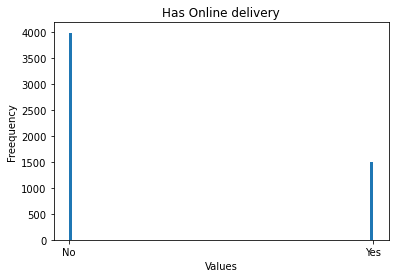

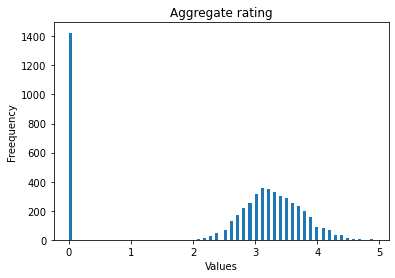

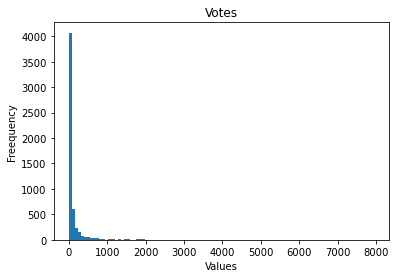

In [74]:
for col in df_nd_clean.columns:
    plt.figure()
    plt.hist(df_nd_clean[col], bins=100) 
    plt.title(col)
    plt.xlabel("Values")
    plt.ylabel("Freequency")
    plt.show()

Overall, many of the distributions are exponentials that are right-skewed. This can cause an issue during modeling. We might have class imbalances.

If we increase the size of samples, we will solve this problem. As per The Central Limit Theorem, with the increase in sample size, the mean of distributions will become normal. We will keep this sample size for this project and will increase it for future modeling.

'Aggregate rating' column values are normally distributed with the outliers at 0. We will consider this fact when we will modeling.

We will save our cleaned data set as 'Nataliya_Parshyna_Peaceful_Restaurant_data_df_nd_clean_Part_I.csv' file to use in Part II Notebook.

In [75]:
# write df_nd_clean to CSV file for future needs
df_nd_clean.to_csv('Nataliya_Parshyna_Peaceful_Restaurant_data_df_nd_clean_Part_I.csv', index = False, header=True)

## Conclusion

In this Notebook, we have analyzed the Zomato data set from the Kaggle website. 

We have extracted New Delhi information and built several plots and maps to visualize different data set features. 

We established that Chinese food is popular in New Delhi, and also no major food chains are serving Chinese cuisine. However, many restaurants serving Chinese food, have combined cuisines (ie. Chinese and Indian, Chinese and Thai, etc.). The Indian/Chinese combined kitchen is in second place in popularity in New Delhi. Also, the price for two people at some Chinese Restaurants is sometimes higher than the average price for two people in this data set.

We showed that the majority of restaurants do not have online delivery options and do not accept table reservations. After EDA, we could not say what neighborhood would be the best to open "Peaceful Restaurant" as restaurants are evenly distributed among all neighborhoods.